In [1]:
# -*- coding: utf-8 -*-
import pandas as pd
import pymysql
#pymysql.install_as_MySQLdb()
import sklearn.mixture as mix
import numpy as np
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns#添加Seaborn模块
%matplotlib inline

#不输出警告
import warnings
warnings.filterwarnings("ignore")
import datetime
import pickle
from sklearn.externals import joblib

### 数据库连接

In [2]:

def get_conn():
    """
    :return: 连接，游标
    """
    # 创建连接
    conn = pymysql.connect(host="localhost",
                           user="root",
                           password="7515",
                           db="air_condition",
                           charset="utf8")
    # 创建游标
    cursor = conn.cursor()# 执行完毕返回的结果集默认以元组显示
    return conn, cursor

def close_conn(conn, cursor):
    cursor.close()
    conn.close()

def query(sql,*args):
    """
    封装通用查询
    :param sql:
    :param args:
    :return: 返回查询到的结果，((),(),)的形式
    """
    conn, cursor = get_conn()
    cursor.execute(sql,args)
    res = cursor.fetchall()
    close_conn(conn, cursor)
    return res

def querydf(sql):
    ## 连接到一个给定的数据库
    conn, cursor=get_conn()
    df = pd.read_sql(sql, con=conn)
    conn.close()
    return df

## 高斯模型

In [3]:
#计算CV值
def calculate_cv(MG1,MG2):
    NumMixture1 = MG1.n_components
    NumMixture2 = MG2.n_components
    d = 0.0
    for k in range(0,NumMixture1):
        for j in range(0,NumMixture2):
            Sigma1 = MG1.covariances_[k]
            Mu1 = MG1.means_[k]
            Sigma2 = MG2.covariances_[j]
            Mu2 = MG2.means_[j]
            weight = MG1.weights_[k] * MG2.weights_[j]
            dist = L2Dist(Sigma1,Mu1,Sigma2,Mu2)
            d = d + weight*dist
    ''' the L2 norm of each GMM model'''
    n1 = 0.0
    n2 = 0.0
    for k in range(0,NumMixture1):
        for j in range(0,NumMixture1):
            Sigma1 = MG1.covariances_[k]
            Mu1 = MG1.means_[k]
            Sigma2 = MG1.covariances_[j]
            Mu2 = MG1.means_[j]
            weight = MG1.weights_[k]*MG1.weights_[j]
            n1 = n1 + weight * L2Dist(Sigma1,Mu1,Sigma2,Mu2)
    for k in range(0,NumMixture2):
        for j in range(0,NumMixture2):
            Sigma1 = MG2.covariances_[k]
            Mu1 = MG2.means_[k]
            Sigma2 = MG2.covariances_[j]
            Mu2 = MG2.means_[j]
            weight = MG2.weights_[k]*MG2.weights_[j]
            n2 = n2 + weight * L2Dist(Sigma1,Mu1,Sigma2,Mu2)
    cv = d/np.sqrt(n1)/np.sqrt(n2)
    return cv

In [4]:
#计算两个高斯分布之间的距离
def L2Dist(sigma1,mean1,sigma2,mean2):
    '''
    calculate the L2 distance between two multivariate Gaussian distributisons
    
    '''    
    n = mean1.size
    
    '''L2 norm of sigma1, mean1'''
    
    invsigma1 = np.linalg.inv(sigma1)
    invsigma2 = np.linalg.inv(sigma2)
    u = invsigma1*mean1 + invsigma2*mean2
    invsigma = np.linalg.inv(sigma1+sigma2)
    f1norm = 1/math.sqrt( math.sqrt( (2*math.pi)**n*np.linalg.det(sigma1)*2**n ) )
    '''L2 norm of sigma2, mean2'''
    f2norm = 1/math.sqrt( math.sqrt( (2*math.pi)**n*np.linalg.det(sigma2)*2**n ) )
    '''inner product of pdf f1 and f2'''
    
    InnerProd = 1/(math.sqrt(2*math.pi)**n) * math.sqrt(np.linalg.det(invsigma)) * \
                np.exp(-1/2*(-u.T*sigma1*invsigma*sigma2*u + mean1.T*invsigma1*mean1 + mean2.T*invsigma2*mean2))
    '''L2 distance between f1 and f2'''
    d = InnerProd/f1norm/f2norm
    
    return d

In [5]:
#训练高斯模型
def gmm_clustering(k,X,cov_type=None):
    '''
    基于高斯混合模型GMM进行无监督学习，聚类
    其中GMM采用传统的EM算法进行参数估计
    
    输入参数含义:
    k    ————   聚类的数目，必填项
    X    ————   样本的输入，比填项
    cov_type  ————  协方差类型，可选项
            四种选择：'spherical', 'tied', 'diag', 'full'
            如果不填写，则默认为'full'
        
    '''
    if cov_type is None:
        cov_type = 'full'   
    
    gmm = mix.GaussianMixture(n_components=k,covariance_type=cov_type)
    gmm.fit(X)
    
    return gmm

In [33]:

database='condition_data'
sql="select * from "+database #  read_flag is nulland 
df=querydf(sql)
  
df['HappenTime']=pd.to_datetime(df['HappenTime'])
df=df.set_index('HappenTime')
df.shape
df.head()

,id,Metro_Line_No,Train_Type,TrainNo,CarriageNo,UnitNo,ReturnTemper_1,ReturnTemper_2,VentilationTemper_1,VentilationTemper_2,...,OuterFan_2,Compressor_1,Compressor_2,Return_Air_Valve,Fresh_Air_Valve,Eleic_Expan_Valve_1,Eleic_Expan_Valve_2,Eleic_Expan_Valve_3,Eleic_Expan_Valve_4,Fresh_Alve_Demend
HappenTime,,,,,,,,,,,,,,,,,,,,,
2020-02-01 00:11:00,813244,5L,05C01,534,M1,1#,96.0,32767.0,92.0,32767.0,...,0.0,0.0,0.0,0.0,0.0,113.0,113.0,113.0,113.0,0.0
2020-02-01 00:16:00,813245,5L,05C01,534,M1,1#,96.0,32767.0,92.0,32767.0,...,0.0,0.0,0.0,0.0,0.0,519.0,519.0,519.0,519.0,0.0
2020-02-01 09:26:00,813246,5L,05C01,534,M1,1#,81.0,32767.0,97.0,32767.0,...,0.0,0.0,0.0,0.0,0.0,88.0,88.0,88.0,88.0,0.0
2020-02-01 09:27:00,813247,5L,05C01,534,M1,1#,81.0,32767.0,98.0,32767.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-02-01 09:28:00,813248,5L,05C01,534,M1,1#,81.0,32767.0,98.0,32767.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [120]:
df.shape

(923400, 117)

In [121]:
df_train=df.copy()

In [122]:
df_train.drop(['id'],inplace=True,axis=1)

In [123]:
cols=df_train.columns

In [124]:
df_train=df_train[df_train['TrainNo']=='534']

In [127]:
drop_cols=[]
for col in cols:
    if len(df_train[col].value_counts())<=1  :
        drop_cols.append(col)
drop_cols   

['Metro_Line_No',
 'Train_Type',
 'TrainNo',
 'ReturnTemper_2',
 'VentilationTemper_2',
 'Sys1_Evaporator1_MedTemper',
 'Sys1_Evaporator2_MedTemper',
 'Sys2_Evaporator1_MedTemper',
 'Sys2_Evaporator2_MedTemper',
 'Evaporator1_OutletTemper_2',
 'Evaporator2_OutletTemper_2',
 'Sys1_HighPressure',
 'Sys2_HighPressure',
 'Sys1_CondensPressure',
 'Sys2_CondensPressure',
 'Passenger_CompartTempter_2',
 'Passenger_HumidityTempter_2',
 'UnitTempter_1',
 'UnitTempter_2',
 'UnitHumidity_1',
 'UnitHumidity_2',
 'L1_L2_V',
 'L3_L2_V',
 'L1_L3_V',
 'L1_Current',
 'L2_Current',
 'L3_Current',
 'N_Current',
 'Sys1_Discharge_Superheat',
 'Sys2_Discharge_Superheat',
 'Sys1_Condens_Undercool',
 'Sys2_Condens_Undercool',
 'Sys1_CondensSat_Tempter',
 'Sys2_CondensSat_Tempter',
 'Vehicle_load',
 'Return_Air_MeanHumidity',
 'Dew_Point_Humidity',
 'Return_Air_MeanHumidity_T',
 'Sys2_Coil1_Outlet_Superheat',
 'Sys1_Coil2_Outlet_Superheat_0',
 'Dehumidification_Status',
 'Mean_Evaporation_Mediate_Temper',
 'Me

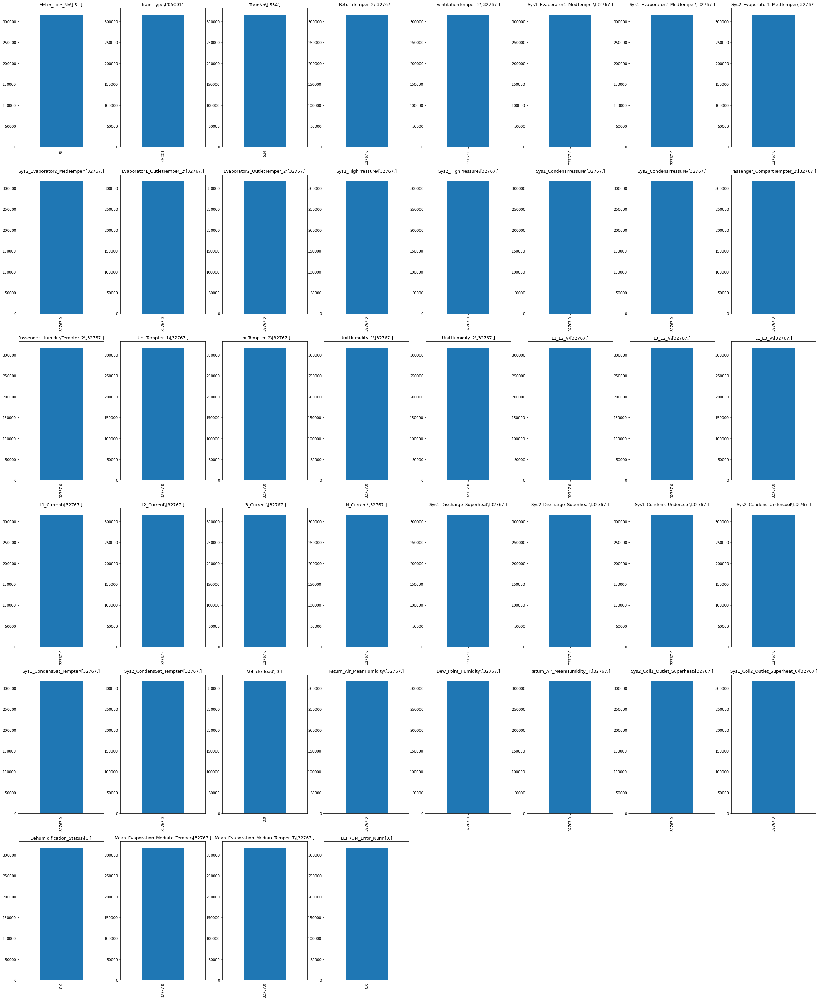

In [128]:
fig=plt.figure(figsize=(40,50))
cols=8
rows=len(drop_cols)//cols+1
for i,col in enumerate(drop_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    df_train[col].value_counts().plot(kind='bar',ax=ax)
    ax.set_title("{}\{}".format(col, df_train[col].value_counts().keys().values))   

In [129]:
df_train.drop(drop_cols,axis=1,inplace=True)

### 机组1

In [140]:
df_train=df_train[df_train['UnitNo']=='1#']

In [141]:
df_train_MP1=df_train[df_train['CarriageNo']=='MP1']
df_train_MP2=df_train[df_train['CarriageNo']=='MP2']
df_train_TC1=df_train[df_train['CarriageNo']=='TC1']
df_train_M1=df_train[df_train['CarriageNo']=='M1']
df_train_M2=df_train[df_train['CarriageNo']=='M2']

In [151]:
df_all=[df_train_MP1,df_train_MP2,df_train_TC1,df_train_M1,df_train_M2]
df_all_titlle=['df_train_MP1','df_train_MP2','df_train_TC1','df_train_M1','df_train_M2']

In [142]:
train_cols=df_train.columns
train_cols

Index(['CarriageNo', 'UnitNo', 'ReturnTemper_1', 'VentilationTemper_1',
       'DeliveryTemper_1', 'DeliveryTemper_2', 'Evaporator1_OutletTemper_1',
       'Evaporator2_OutletTemper_1', 'Condenser1_Temper', 'Condenser2_Temper',
       'Sys1_InspiratoryTemper', 'Sys2_InspiratoryTemper',
       'Sys1_ExhaustTemper', 'Sys2_ExhaustTemper', 'Sys1_LowPressure',
       'Sys2_LowPressure', 'Passenger_CompartTempter_1',
       'Passenger_HumidityTempter_1', 'FreshValve_FB_1', 'FreshValve_FB_2',
       'Energy_H', 'Energy_L', 'PowerRate_H', 'PowerRate_L', 'Unit_Mean_V',
       'Unit_Mean_Current', 'Sys1_Inspiratory_Superheat',
       'Sys2_Inspiratory_Superheat', 'Sys1_EvaporSat_Tempter',
       'Sys2_EvaporSat_Tempter', 'Return_Air_Mean_Temper',
       'Outlet_Air_MeanTemper', 'Fresh_Air_MeanTemper',
       'Return_Air_HotSpot_Temper', 'Outlet_HotSpot_Temper', 'Control_Temper',
       'Control_Humidity', 'Return_Air_MeanTemper_T',
       'Outlet_Air_MeanTemper_T', 'Fresh_Air_MeanTemper_T',
    

### df_train_M1 可视化

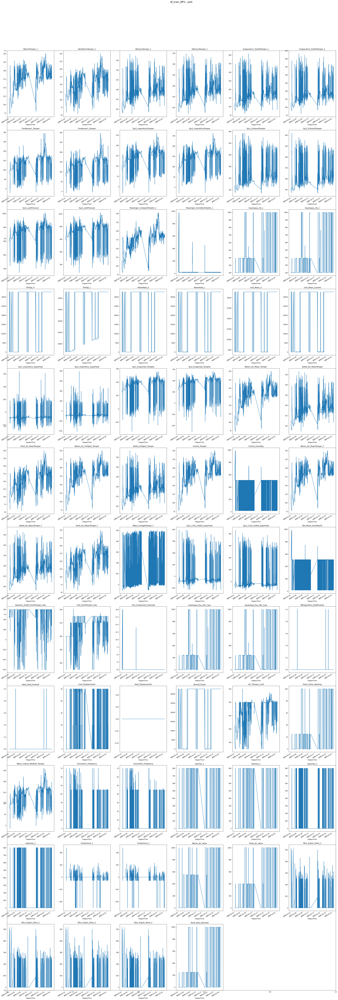

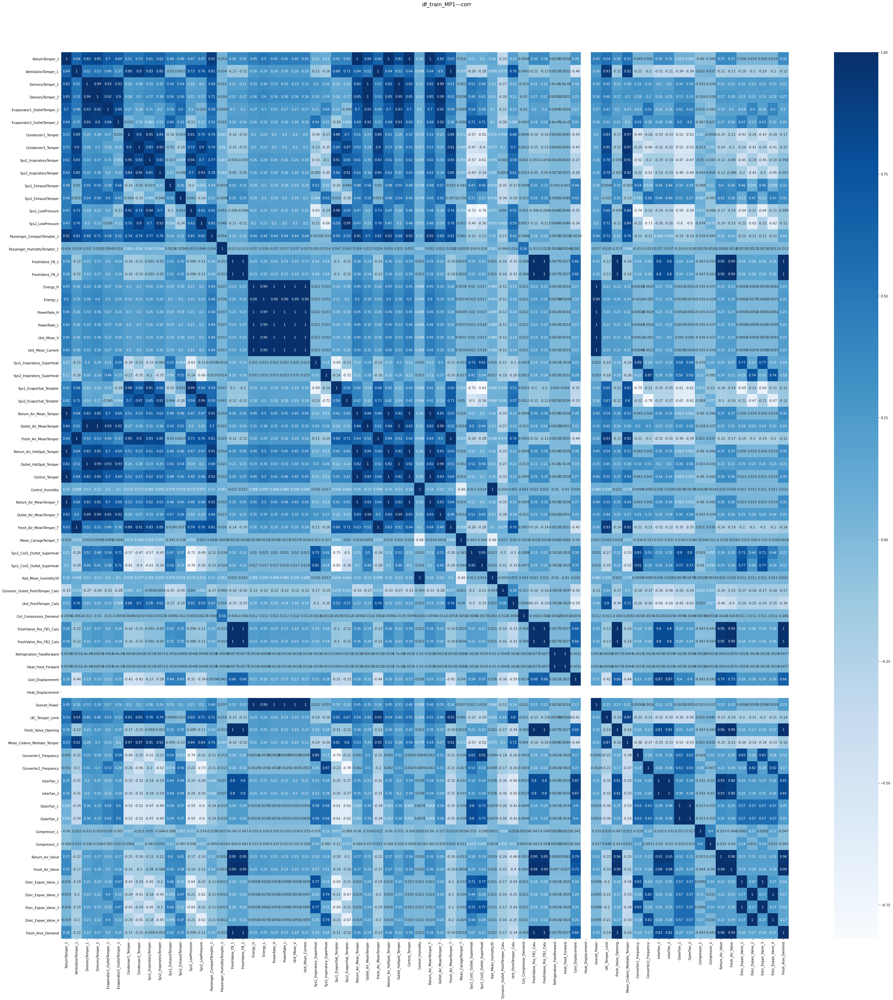

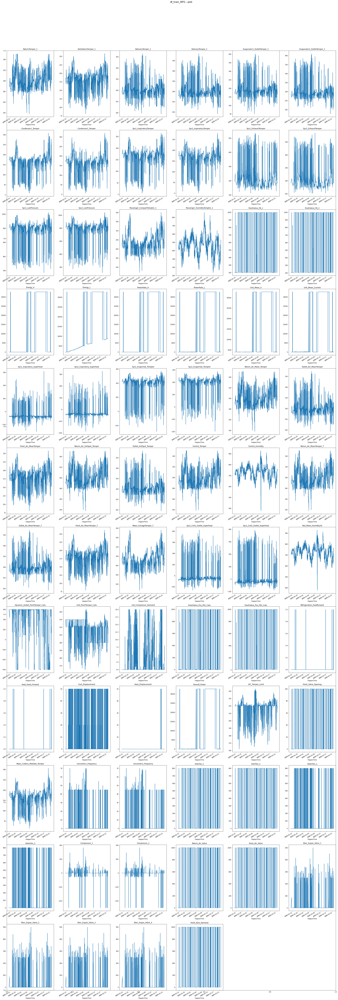

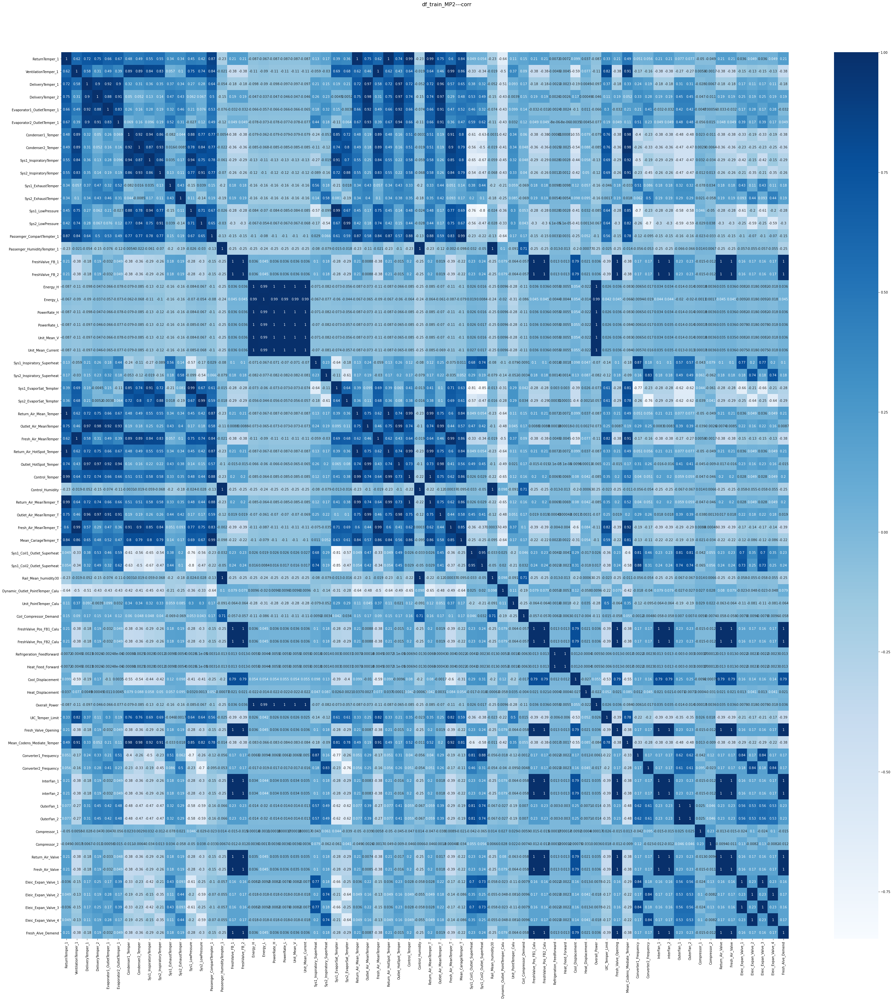

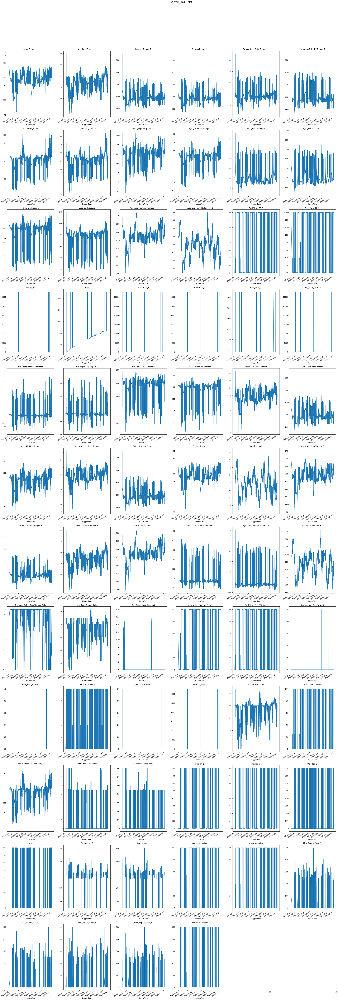

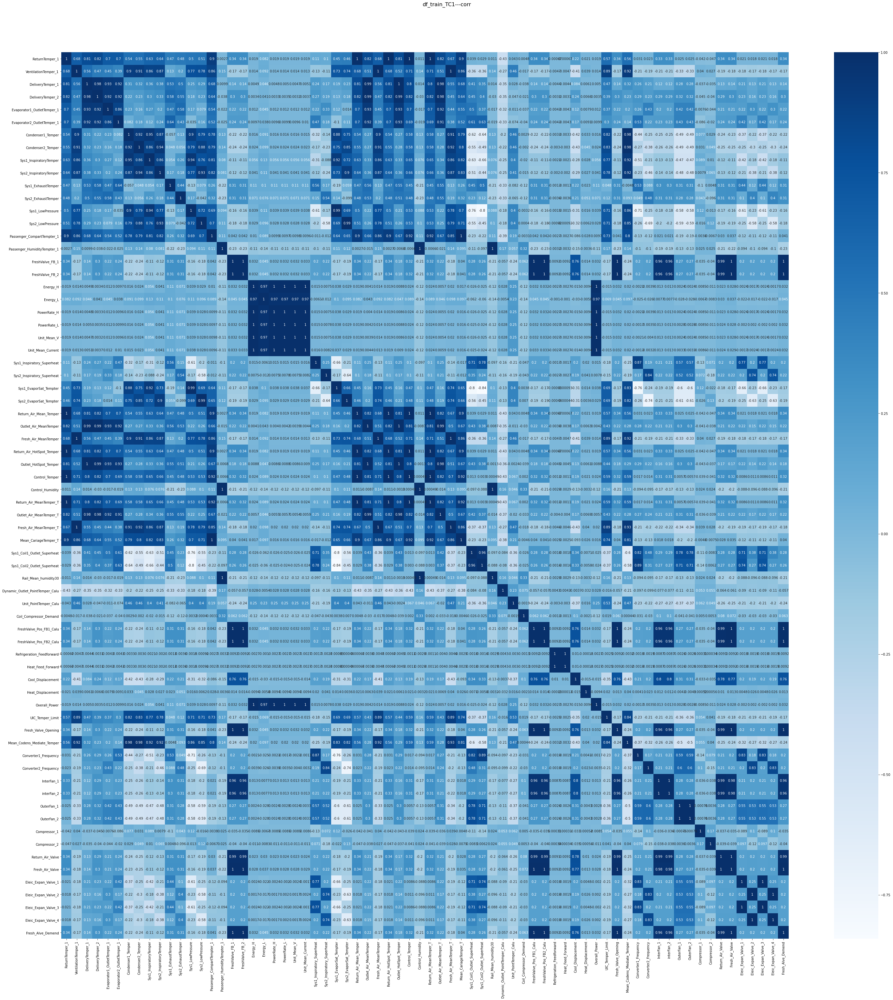

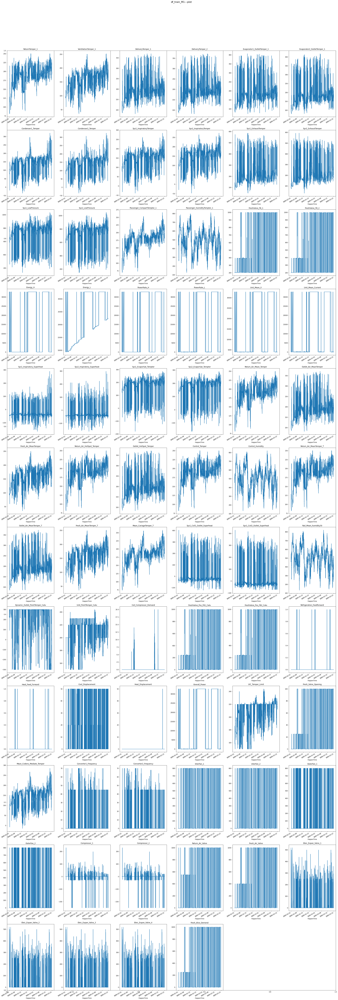

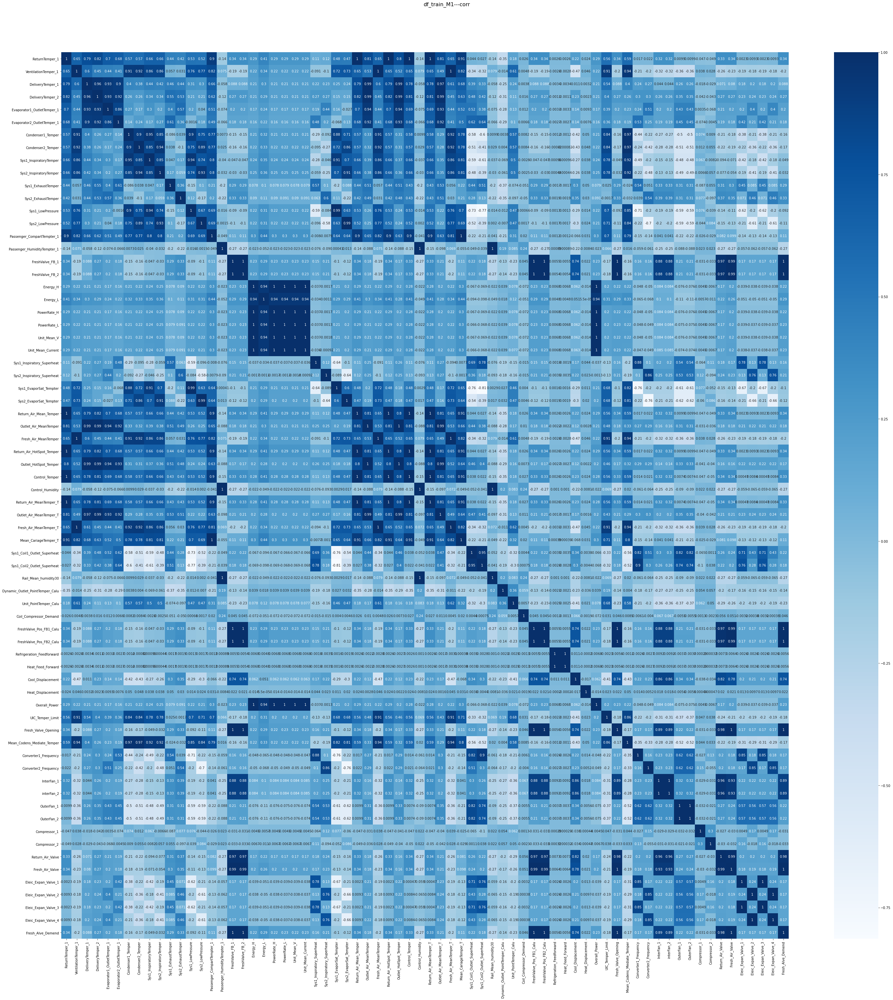

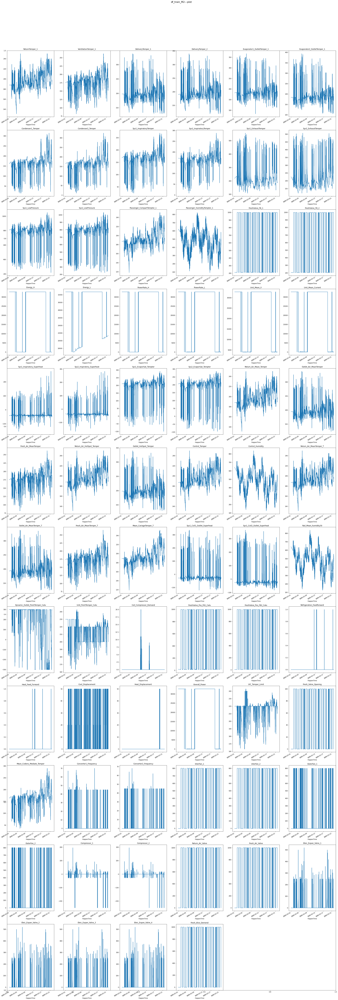

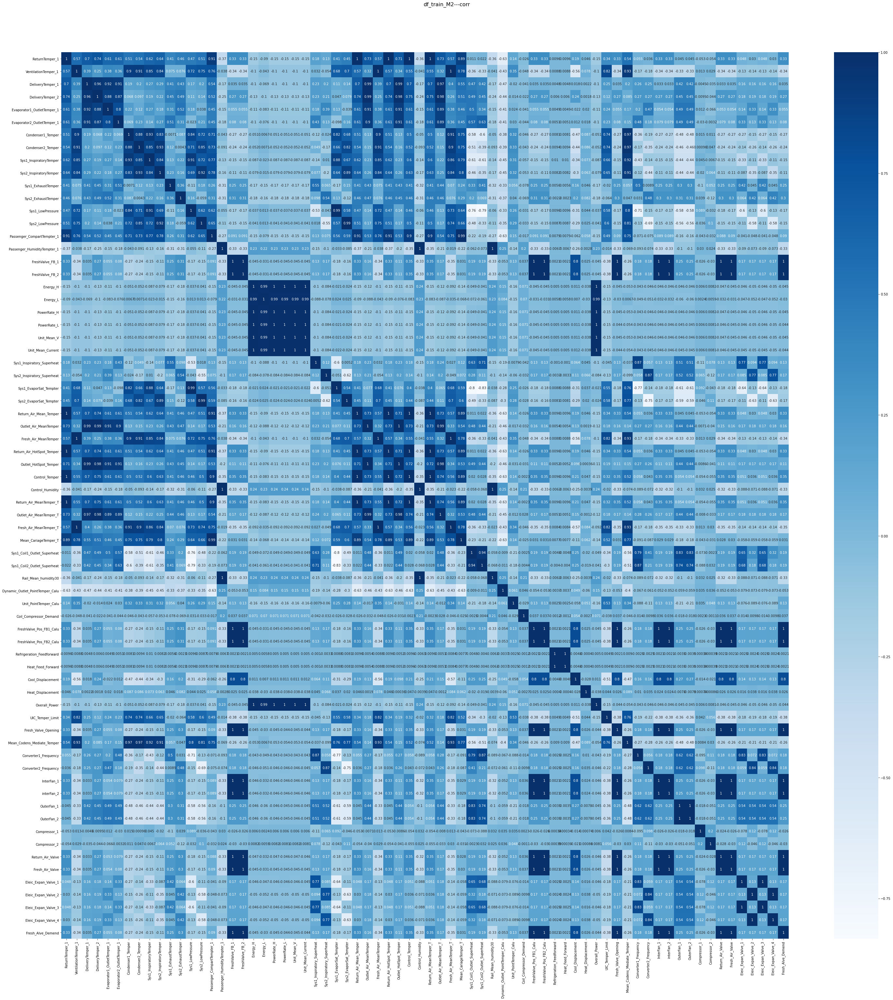

In [154]:

train_cols=df_train.columns
for ii in range(5):
    #1曲线图
    fig=plt.figure(figsize=(40,130))
    plt.title('{}---plot'.format(df_all_titlle[ii]),fontsize=16,x=0.53,y=1.05,)
    cols=6
    rows=len(train_cols[2:])//cols+1
    for i,col in enumerate(train_cols[2:]):
        ax=fig.add_subplot(rows,cols,i+1)
        df=df_all[ii]
        df[col].plot(kind='line',ax=ax)
        ax.set_title(col)  
    # 2相关图
    fig=plt.figure(figsize=(50,50))
    plt.title('{}---corr'.format(df_all_titlle[ii]),fontsize=16,x=0.53,y=1.05,)
    corr = df_all[ii].corr()
    sns.heatmap(corr, cmap='Blues', annot=True)
    

<AxesSubplot:>

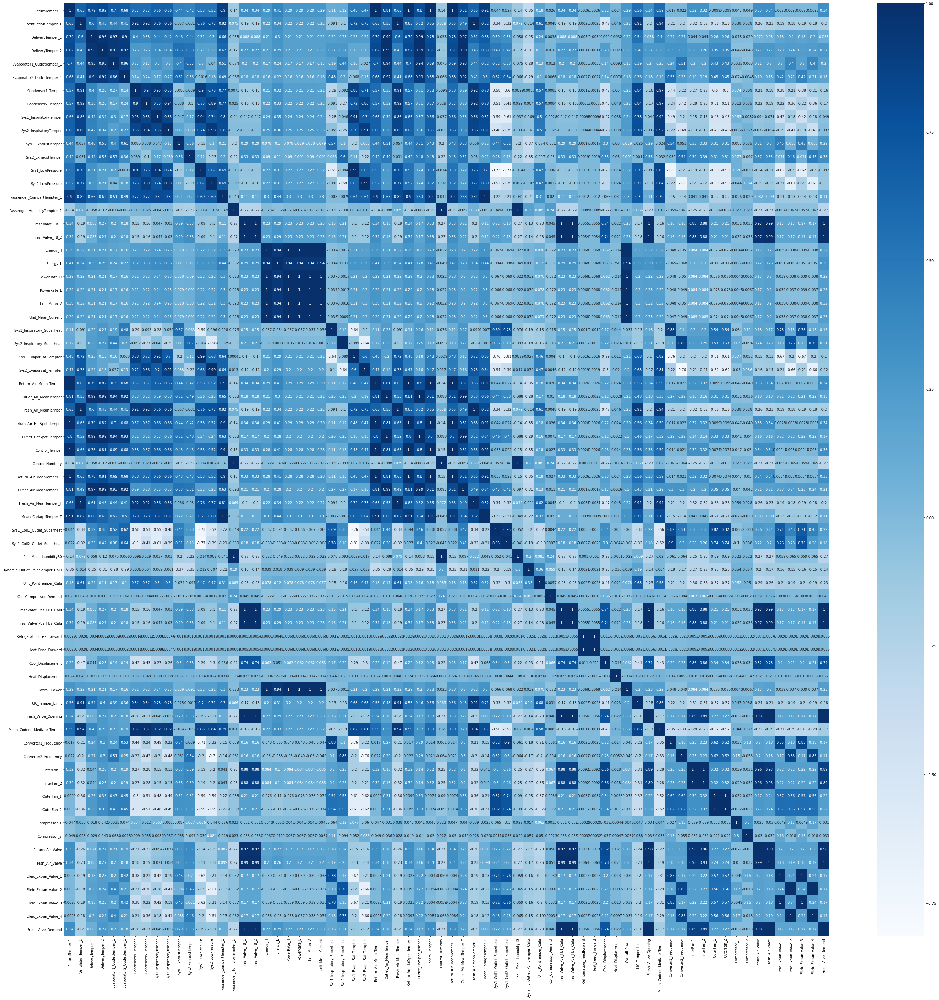